In [1]:
# psdc_blur
import cv2
import numpy as np
import matplotlib.pylab as plt
import math

def psdc_blur(file_path, improve_contrast=True, detail_enhance=1, 
              gaussian_blur_ksize=7, gaussian_blur_sigma=2, unsharp_mask_ksize=9, show_result=True):
    # Load the image from file
    image = cv2.imread(file_path)

    # Convert the image to grayscale (needed for many image processing operations)
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply a Gaussian blur to smooth the image and reduce noise
    image_blurred = cv2.GaussianBlur(image_gray, (gaussian_blur_ksize, gaussian_blur_ksize), gaussian_blur_sigma)

    if improve_contrast:
        # Create a CLAHE (Contrast Limited Adaptive Histogram Equalization) object
        # CLAHE improves local contrast, particularly useful for low-contrast regions
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

        # Apply CLAHE to the blurred image to enhance contrast
        image_blurred = clahe.apply(image_blurred)

    # Define a function for unsharp masking to sharpen the image
    # Unsharp masking enhances edges by subtracting a blurred version from the original
    def unsharp_mask(image, kernel_size=(unsharp_mask_ksize, unsharp_mask_ksize), sigma=1.0, strength=1.0):
        # Apply Gaussian blur to the image with the given kernel size and sigma
        blurred = cv2.GaussianBlur(image, kernel_size, sigma)
        
        # Calculate the mask by adding the original image and the inverted blurred image
        # Strength controls the intensity of the sharpening effect
        mask = cv2.addWeighted(image, 1 + strength, blurred, -strength, 0)
        
        # Ensure pixel values stay within the valid range [0, 255] and convert to unsigned 8-bit integer
        return np.clip(mask, 0, 255).astype(np.uint8)

    # Multiple applications can increase sharpness but may introduce noise or artifacts
    for i in range(detail_enhance):
        image_blurred = unsharp_mask(image_blurred)

    if show_result:
        # Display the resulting image using Matplotlib
        # Displayed in grayscale mode and with axis turned off
        plt.figure(figsize=(15,15))
        plt.imshow(image_blurred, cmap='gray')
        plt.title('Blur')
        plt.axis('off')
        plt.show()
    
    return image, image_gray, image_blurred


In [2]:
# psdc_binarize
def psdc_binarize(image_blurred, threshold=32, grad_ksize=1, show_result=True):
    if grad_ksize > 0:
        image_grad_x = cv2.Sobel(image_blurred, cv2.CV_8UC1, dx=1, dy=0, ksize=grad_ksize)  # Horizontal gradient
        image_grad_y = cv2.Sobel(image_blurred, cv2.CV_8UC1, dx=0, dy=1, ksize=grad_ksize)  # Vertical gradient

        # Subtract the gradients
        image_grad = cv2.add(image_grad_x, image_grad_y)

        # Convert the result to absolute scale
        image_grad = cv2.convertScaleAbs(image_grad)

        _, image_bin = cv2.threshold(image_grad, threshold, 255, cv2.THRESH_BINARY)
    else:
        _, image_bin = cv2.threshold(image_blurred, threshold, 255, cv2.THRESH_BINARY)

    if show_result:
        if grad_ksize > 0:
            plt.figure(figsize=(15,15))
            plt.imshow(image_grad, cmap='gray')
            plt.title('Gradient')
            plt.axis('off')
            plt.show()

        plt.figure(figsize=(15,15))
        plt.imshow(image_bin, cmap='gray')
        plt.title('Binary')
        plt.axis('off')
        plt.show()

    return image_bin

In [3]:
# psdc_pre_process_detect_edge
def psdc_pre_process_detect_edge(image_bin, canny_threshold=(30, 180), show_result=True):
    canny_threshold_min, canny_threshold_max = canny_threshold
    image_canny = cv2.Canny(image_bin, canny_threshold_min, canny_threshold_max)

    if show_result:
        # Display the result
        plt.figure(figsize=(15,15))
        plt.imshow(image_canny, cmap='gray')
        plt.title('Pre-Process Canny')
        plt.axis('off')
        plt.show()

    return image_canny

In [4]:
class LineSegment:
    def __init__(self, x1, y1, x2, y2):
        """
        Initialize the line segment with two endpoints (x1, y1) and (x2, y2).
        This constructor also calculates the distance from the origin (0, 0) to the line segment's closest point
        and the length of the line segment.
        
        :param x1: x-coordinate of the first endpoint of the line segment
        :param y1: y-coordinate of the first endpoint of the line segment
        :param x2: x-coordinate of the second endpoint of the line segment
        :param y2: y-coordinate of the second endpoint of the line segment
        """
        
        # Initialize the x and y coordinates of the two endpoints of the line segment
        self.x1, self.y1 = x1, y1  # Coordinates of the first endpoint
        self.x2, self.y2 = x2, y2  # Coordinates of the second endpoint
        
        # Calculate the distance from the origin (0, 0) to the line segment
        # The distance_from_origin method computes this distance
        self.distance_from_origin = self.distance_to_point(0, 0)  # Distance to origin
        
        # Calculate the length of the line segment
        # The calculate_length method computes the Euclidean distance between the two endpoints
        self.length = self.calculate_length()  # Length of the line segment

    def get_general_form(self):
        """
        Compute the coefficients A, B, and C for the general form of a line equation: Ax + By + C = 0.
        :return: A tuple (A, B, C) representing the coefficients of the general line equation.
        """
        
        # Calculate the coefficient A as the difference in y-coordinates of the line endpoints
        A = self.y2 - self.y1  # A represents the vertical component of the line direction
    
        # Calculate the coefficient B as the negative difference in x-coordinates of the line endpoints
        B = self.x1 - self.x2  # B represents the horizontal component of the line direction
    
        # Calculate the constant term C as the determinant of the line endpoints
        # This is equivalent to the negative of the line's intercept with the x-axis
        C = self.x2 * self.y1 - self.x1 * self.y2
    
        # Return the coefficients A, B, and C as a tuple
        return A, B, C

    def angle_with_other(self, segment, directed=False):
        """
        Calculate the angle between this line segment and another segment.
        :param segment: Another line segment object
        :param directed: If True, the angle is calculated as a directed angle 
                         (accounting for clockwise or counterclockwise direction).
                         If False, the angle is undirected and represents the smallest angle.
        :return: Angle in degrees
        """
    
        # Calculate the vector components for the first segment (self)
        v1x, v1y = self.x2 - self.x1, self.y2 - self.y1  # Vector from (x1, y1) to (x2, y2) for the current segment
        
        # Calculate the vector components for the second segment
        v2x, v2y = segment.x2 - segment.x1, segment.y2 - segment.y1  # Vector from (x1, y1) to (x2, y2) for the other segment
        
        # Calculate the dot product of the two vectors: v1 • v2 = |v1| * |v2| * cos(θ)
        dot_product = v1x * v2x + v1y * v2y
        
        # Calculate the magnitude (length) of the first vector
        mag_v1 = math.sqrt(v1x**2 + v1y**2)
        
        # Calculate the magnitude (length) of the second vector
        mag_v2 = math.sqrt(v2x**2 + v2y**2)
        
        # Calculate the cosine of the angle between the two vectors
        cos_theta = dot_product / (mag_v1 * mag_v2)  # Normalize using magnitudes
        
        # Clamp the cosine value to the valid range for arccos to avoid rounding errors
        cos_theta = max(-1, min(1, cos_theta))
        
        # Calculate the angle in radians using arccos
        angle_radians = math.acos(cos_theta)
        
        # Convert the angle from radians to degrees
        angle_degrees = math.degrees(angle_radians)
        
        if directed:
            # If directed is True, determine the direction of the angle using the cross product
            # Cross product helps decide if the angle is clockwise or counterclockwise
            cross_product = v1x * v2y - v1y * v2x
            
            if cross_product < 0:
                # If the cross product is negative, the angle is clockwise; adjust it
                angle_degrees = 360 - angle_degrees
            
            return angle_degrees
        else:
            # If directed is False, return the smallest angle (undirected)
            # The undirected angle is the minimum of the angle or its complement (180 - angle)
            return min(angle_degrees, 180 - angle_degrees)

    
    def calculate_length(self):
        """Calculate the length of the line segment."""
        dx = self.x2 - self.x1
        dy = self.y2 - self.y1
        return math.sqrt(dx**2 + dy**2)

    def distance_to_point(self, px, py):
        """Calculate the perpendicular distance from a point (px, py) to the line segment."""
        line_length = self.calculate_length()
        if line_length == 0:
            # Distance from point to a point (when line segment is a point)
            return math.sqrt((self.x1 - px)**2 + (self.y1 - py)**2)
        
        # Calculate perpendicular distance from point to line segment
        t = ((px - self.x1) * (self.x2 - self.x1) + (py - self.y1) * (self.y2 - self.y1)) / (line_length ** 2)
        t = max(0, min(1, t))  # Clamp t to range [0, 1]
        projection_x = self.x1 + t * (self.x2 - self.x1)
        projection_y = self.y1 + t * (self.y2 - self.y1)
        return math.sqrt((px - projection_x)**2 + (py - projection_y)**2)

    def distance_to_other_line(self, other_line):
        """Calculate the shortest distance between this line segment and another."""
        # Get the minimum distance from each endpoint of one line to the other line segment
        return min(
            self.distance_to_point(other_line.x1, other_line.y1),
            self.distance_to_point(other_line.x2, other_line.y2),
            other_line.distance_to_point(self.x1, self.y1),
            other_line.distance_to_point(self.x2, self.y2)
        )

    def intersection_with(self, other_line):
        """
        Calculate the intersection point of two line segments using normalization to avoid overflow.
        :param other_line: Another line segment object
        :return: Intersection point (x, y) or None if there is no intersection
        """
    
        def on_segment(p, q, r):
            """
            Check if point q lies on line segment pr.
            :param p: Start point of the line segment (tuple: x, y)
            :param q: Point to check (tuple: x, y)
            :param r: End point of the line segment (tuple: x, y)
            :return: True if q lies on the line segment, otherwise False
            """
            # Check if q is within the bounding box of segment pr
            if min(p[0], r[0]) <= q[0] <= max(p[0], r[0]) and min(p[1], r[1]) <= q[1] <= max(p[1], r[1]):
                return True
            return False
    
        # Extract coordinates of the current line segment
        x1, y1, x2, y2 = self.x1, self.y1, self.x2, self.y2
        # Extract coordinates of the other line segment
        x3, y3, x4, y4 = other_line.x1, other_line.y1, other_line.x2, other_line.y2
    
        # Calculate the normalization scale factor (maximum absolute value of all coordinates)
        scale = max(abs(x1), abs(y1), abs(x2), abs(y2), abs(x3), abs(y3), abs(x4), abs(y4))
    
        # Normalize all coordinates to prevent numerical overflow
        x1, y1, x2, y2 = x1 / scale, y1 / scale, x2 / scale, y2 / scale
        x3, y3, x4, y4 = x3 / scale, y3 / scale, x4 / scale, y4 / scale
    
        # Compute line equation parameters for the first line: a1 * x + b1 * y = c1
        a1, b1 = y2 - y1, x1 - x2
        c1 = a1 * x1 + b1 * y1
    
        # Compute line equation parameters for the second line: a2 * x + b2 * y = c2
        a2, b2 = y4 - y3, x3 - x4
        c2 = a2 * x3 + b2 * y3
    
        # Compute the determinant to check if lines are parallel or coincident
        determinant = a1 * b2 - a2 * b1
    
        if determinant == 0:
            # If determinant is 0, the lines are parallel or coincident, so no intersection
            return None
    
        # Calculate the intersection point in the normalized coordinate system
        x = (b2 * c1 - b1 * c2) / determinant
        y = (a1 * c2 - a2 * c1) / determinant
    
        # Check if the intersection point lies on both line segments
        intersection = (x, y)
        if on_segment((x1, y1), intersection, (x2, y2)) and on_segment((x3, y3), intersection, (x4, y4)):
            # Rescale the intersection point back to the original coordinate system
            x, y = x * scale, y * scale
            return (x, y)
    
        # If the intersection point is not on both line segments, return None
        return None


    def merge(self, other):
        """Merge this line segment with another, adjusting endpoints as needed."""
        min_x = min(self.x1, self.x2, other.x1, other.x2)
        min_y = min(self.y1, self.y2, other.y1, other.y2)
        max_x = max(self.x1, self.x2, other.x1, other.x2)
        max_y = max(self.y1, self.y2, other.y1, other.y2)

        # Create new line segment representing the merged line
        temp = []
        temp.append(LineSegment(self.x1, self.y1, other.x1, other.y1))
        temp.append(LineSegment(self.x1, self.y1, other.x2, other.y2))
        temp.append(LineSegment(self.x2, self.y2, other.x1, other.y1))
        temp.append(LineSegment(self.x2, self.y2, other.x2, other.y2))
        temp.append(self)
        temp.append(other)
        temp = sorted([seg for seg in temp],
                       key=lambda seg: seg.length)

        return LineSegment(temp[-1].x1, temp[-1].y1, temp[-1].x2, temp[-1].y2)
    
    def __repr__(self):
        return f"LineSegment(({self.x1:.2f}, {self.y1:.2f}), ({self.x2:.2f}, {self.y2:.2f}), "\
               f"length={self.length:.2f}, "\
               f"distance={self.distance_from_origin:.2f})"

def bresenham_line(x1, y1, x2, y2):
    points = []
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)
    sx = 1 if x1 < x2 else -1
    sy = 1 if y1 < y2 else -1
    err = dx - dy

    while True:
        points.append((x1, y1))  
        if x1 == x2 and y1 == y2:  
            break
        e2 = err * 2
        if e2 > -dy:
            err -= dy
            x1 += sx
        if e2 < dx:
            err += dx
            y1 += sy

    return points

def calculate_mean_color(image, x1, y1, x2, y2):
    points = bresenham_line(x1, y1, x2, y2)
    color = 0
    
    for point in points:
        x, y = point
        color = color + (int)(image[y, x])
    
    return color / len(points)

In [5]:
# psdc_detect_base_line
def rotate_image(image, angle):
    # Get the image dimensions
    (height, width) = image.shape[:2]
    
    # Compute the center of the image
    center = (width // 2, height // 2)
    
    # Create the rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale=1.0)

    # Calculate the size of the rotated image
    cos = np.abs(rotation_matrix[0, 0])
    sin = np.abs(rotation_matrix[0, 1])
    new_width = int((height * sin) + (width * cos))
    new_height = int((height * cos) + (width * sin))
    
    # Adjust the rotation matrix to account for translation
    rotation_matrix[0, 2] += (new_width / 2) - center[0]
    rotation_matrix[1, 2] += (new_height / 2) - center[1]

    # Perform the rotation
    return cv2.warpAffine(image, rotation_matrix, (new_width, new_height))

def psdc_detect_base_line(image, image_gray, image_canny, color_threshold=170, hough_line_params=(12, 60, 4), show_result=True):
    # Make a copy of the original image
    image_copy = np.copy(image)

    hough_line_threshold, hough_line_min_len, hough_line_max_gap = hough_line_params
    # Detect lines using the Hough Line Transform in the binary image
    lines = cv2.HoughLinesP(image_canny, 1, np.pi/180, threshold=hough_line_threshold, minLineLength=hough_line_min_len, maxLineGap=hough_line_max_gap)

    white_segments = []  # List to store segments identified as white lines
    # Check if any lines are detected
    if lines is not None:
        lines = [line[0] for line in lines]  # Extract the coordinates of the detected lines
        for line in lines:
            x1, y1, x2, y2 = line
            # Use color conditions to filter out white lines
            color = calculate_mean_color(image_gray, x1, y1, x2, y2)
            
            # If color condition is met (indicating a white line), add the segment to white_segments
            if color > color_threshold:  # Assuming white lines have high brightness
                # Create a LineSegment object for each line
                lineSegment = LineSegment(x1, y1, x2, y2)
                cv2.line(image_copy, (lineSegment.x1, lineSegment.y1), (lineSegment.x2, lineSegment.y2), (0, 255, 0), 2)
                # print(f'{lineSegment}-{color:.0f}')
                white_segments.append(lineSegment)

    # find the longest line since the longest one is probably one of the parking lanes
    longest_base_line = max(white_segments, key=lambda line: line.length)
    cv2.line(image_copy, (longest_base_line.x1, longest_base_line.y1), (longest_base_line.x2, longest_base_line.y2), (255, 0, 0), 2)

    if show_result:
        # Display the final result with parking spots and vacancy information
        plt.figure(figsize=(15,15))
        plt.imshow(image_copy, cmap='gray')
        plt.title('Base Line')
        plt.axis('off')
        plt.show()
    
    return longest_base_line

In [6]:
# psdc_erode_and_dilate
def psdc_erode_and_dilate(image_bin, longest_base_line, kernel_size_h=6, kernel_size_v=6, iteration=4, show_result=True):
    angle_rotate = longest_base_line.angle_with_other(LineSegment(0, 0, 1, 0), True)
    if show_result:
        print(f'angle_rotate={angle_rotate}')

    image_bin_rotate = rotate_image(image_bin, -angle_rotate)

    kernel_size = np.ones((kernel_size_v, 1))
    erosion_iterations_v = iteration  # Number of iterations for erosion
    image_eroded_rotate_v = cv2.erode(image_bin_rotate, kernel_size, iterations=erosion_iterations_v)

    dilation_iterations_v = iteration  # Number of iteration
    image_dilated_rotate_v = cv2.dilate(image_eroded_rotate_v, kernel_size, iterations=dilation_iterations_v)

    kernel_size = np.ones((1, kernel_size_h))
    erosion_iterations_h = iteration  # Number of iterations for erosion
    image_eroded_rotate_h = cv2.erode(image_bin_rotate, kernel_size, iterations=erosion_iterations_h)

    dilation_iterations = iteration  # Number of iterations for dilation
    image_dilated_rotate_h = cv2.dilate(image_eroded_rotate_h, kernel_size, iterations=dilation_iterations)

    (height, width) = image_bin.shape[:2]

    image_dilated_v = rotate_image(image_dilated_rotate_v, angle_rotate)
    (height_new, width_new) = image_dilated_v.shape[:2]
    image_dilated_v = image_dilated_v[(int)((height_new - height) / 2):(int)((height_new + height) / 2),int((width_new - width) / 2):int((width_new + width) / 2)] 

    image_dilated_h = rotate_image(image_dilated_rotate_h, angle_rotate)
    (height_new, width_new) = image_dilated_h.shape[:2]
    image_dilated_h = image_dilated_h[(int)((height_new - height) / 2):(int)((height_new + height) / 2),int((width_new - width) / 2):int((width_new + width) / 2)] 

    if show_result:
        plt.figure(figsize=(15,15))
        plt.imshow(image_bin_rotate, cmap='gray')
        plt.title('Rotated Binary')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(15,15))
        plt.imshow(image_dilated_rotate_v, cmap='gray')
        plt.title('Rotated V Dilation')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(15,15))
        plt.imshow(image_dilated_rotate_h, cmap='gray')
        plt.title('Rotated H Dilation')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(15,15))
        plt.imshow(image_dilated_v, cmap='gray')
        plt.title('V Dilation')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(15,15))
        plt.imshow(image_dilated_h, cmap='gray')
        plt.title('H Dilation')
        plt.axis('off')
        plt.show()
    
    return image_dilated_h, image_dilated_v


In [7]:
# psdc_post_process_detect_edge
def psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, canny_threshold=(30, 180), show_result=True):
    canny_threshold_min, canny_threshold_max = canny_threshold

    canny_image_v = cv2.Canny(image_dilated_v, canny_threshold_min, canny_threshold_max)
    canny_image_h = cv2.Canny(image_dilated_h, canny_threshold_min, canny_threshold_max)

    if show_result:
        plt.figure(figsize=(15,15))
        plt.title('canny_image_v')
        plt.imshow(canny_image_v, cmap='gray')
        plt.title('Post-Process V Canny')
        plt.axis('off')
        plt.show()

        plt.figure(figsize=(15,15))
        plt.title('canny_image_h')
        plt.imshow(canny_image_h, cmap='gray')
        plt.title('Post-Process H Canny')
        plt.axis('off')
        plt.show()

    return canny_image_h, canny_image_v

In [8]:
# psdc_detect_line
def filter_lines_by_angle(lines, base_line, angle_offset, tolerance):
    """
    Filters out line segments whose angle with the base line deviates from a specified offset by more than a tolerance.
    :param lines: List of line segments, where each line is represented as ((x1, y1), (x2, y2))
    :param base_line: The reference line segment to compare angles with
    :param angle_offset: The desired angle offset (in degrees) between each line and the base line
    :param tolerance: The allowable deviation (in degrees) from the angle offset
    :return: A filtered list of line segments that meet the angle criteria
    """
    
    # Check if the input list of lines is empty
    if not lines:
        return []  # If there are no lines, return an empty list

    # Initialize an empty list to store lines that meet the filtering criteria
    filtered_lines = []

    # Iterate through each line segment in the input list
    for line in lines:
        # Calculate the angle between the current line and the base line
        # Compare it with the specified angle offset, allowing for a tolerance
        if abs(line.angle_with_other(base_line) - angle_offset) <= tolerance:
            # If the angle difference is within the tolerance, add the line to the filtered list
            filtered_lines.append(line)

    # Return the list of filtered lines
    return filtered_lines

def psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line, 
                     hough_line_h_params=(50, 60, 8), hough_line_v_params=(50, 250, 2), 
                     color_threshold=0, angle_tolerance=5, show_result=True):
    # Make a copy of the original image
    image_copy = np.copy(image)

    hough_line_h_threshold, hough_line_h_min_len, hough_line_h_max_gap = hough_line_h_params
    hough_line_v_threshold, hough_line_v_min_len, hough_line_v_max_gap = hough_line_v_params

    # Detect lines using the Hough Line Transform in the binary image
    lines_h = cv2.HoughLinesP(canny_image_h, 1, np.pi/180, threshold=hough_line_h_threshold, minLineLength=hough_line_h_min_len, maxLineGap=hough_line_h_max_gap)
    lines_v = cv2.HoughLinesP(canny_image_v, 1, np.pi/180, threshold=hough_line_v_threshold, minLineLength=hough_line_v_min_len, maxLineGap=hough_line_v_max_gap)

    white_segments_h = []  # List to store segments identified as white lines
    white_segments_v = []

    # Check if any lines are detected
    if lines_h is not None:
        lines = [line[0] for line in lines_h]  # Extract the coordinates of the detected lines
        for line in lines:
            x1, y1, x2, y2 = line
            # Use color conditions to filter out white lines
            color = calculate_mean_color(image_gray, x1, y1, x2, y2)
            
            # If color condition is met (indicating a white line), add the segment to white_segments
            if color > color_threshold:  # Assuming white lines have high brightness
                # Create a LineSegment object for each line
                lineSegment = LineSegment(x1, y1, x2, y2)
                white_segments_h.append(lineSegment)

    white_segments_h = filter_lines_by_angle(white_segments_h, longest_base_line, 0, angle_tolerance)

    if lines_v is not None:
        lines = [line[0] for line in lines_v]  # Extract the coordinates of the detected lines
        for line in lines:
            x1, y1, x2, y2 = line
            # Use color conditions to filter out white lines
            color = calculate_mean_color(image_gray, x1, y1, x2, y2)
            
            # If color condition is met (indicating a white line), add the segment to white_segments
            if color > color_threshold:  # Assuming white lines have high brightness
                # Create a LineSegment object for each line
                lineSegment = LineSegment(x1, y1, x2, y2)
                white_segments_v.append(lineSegment)

    white_segments_v = filter_lines_by_angle(white_segments_v, longest_base_line, 90, angle_tolerance)

    if len(white_segments_v) == 0:
        white_segments_v = white_segments_h
        white_segments_h = []

    for lineSegment in white_segments_h:
        cv2.line(image_copy, (lineSegment.x1, lineSegment.y1), (lineSegment.x2, lineSegment.y2), (0, 255, 0), 2)

    for lineSegment in white_segments_v:
        cv2.line(image_copy, (lineSegment.x1, lineSegment.y1), (lineSegment.x2, lineSegment.y2), (0, 255, 0), 2)

    if show_result:
        plt.figure(figsize=(15,15))
        plt.imshow(image_copy, cmap='gray')
        plt.title('Lines Detect')
        plt.axis('off')
        plt.show()

    return white_segments_h, white_segments_v

In [9]:
# psdc_merge_line
def merge_nearby_segments(segments, threshold, base_line, angle_offset, angle_tolerance):
    """
    Merge nearby line segments with additional angle-based constraints.

    :param segments: List of LineSegment objects.
    :param threshold: Minimum distance between segments to allow merging.
    :param base_line: Reference LineSegment for angle comparison.
    :param angle_offset: Target angle offset from the base_line.
    :param angle_tolerance: Allowable angle deviation from the target.
    :return: List of the longest line segments after merging.
    """
    n = len(segments)
    adjacency_list = [[] for _ in range(n)]
    
    # Step 1: Build adjacency list based on distance
    for i in range(n):
        for j in range(i + 1, n):
            if segments[i].distance_to_other_line(segments[j]) < threshold:
                adjacency_list[i].append(j)
                adjacency_list[j].append(i)

    # Step 2: Perform clustering using DFS
    visited = [False] * n
    clusters = []

    def dfs(node, cluster):
        visited[node] = True
        cluster.append(node)
        for neighbor in adjacency_list[node]:
            if not visited[neighbor]:
                dfs(neighbor, cluster)

    for i in range(n):
        if not visited[i]:
            cluster = []
            dfs(i, cluster)
            clusters.append(cluster)

    # Step 3: Merge line segments with angle constraints
    result = []
    for cluster in clusters:
        merged_segment = segments[cluster[0]]
        for idx in cluster[1:]:
            candidate_segment = merged_segment.merge(segments[idx])
            
            # Calculate angle between new segment and base_line
            angle = candidate_segment.angle_with_other(base_line)
            angle_diff = abs(angle - angle_offset)

            if angle_diff > angle_tolerance:
                # Discard the segment with the larger angle difference
                # angle1 = abs(segments[idx].angle_with_other(base_line) - angle_offset)
                # angle2 = abs(merged_segment.angle_with_other(base_line) - angle_offset)
                # if angle1 >= angle2:
                #     continue  # Keep merged_segment, discard segments[idx]
                # else:
                #     merged_segment = segments[idx]  # Replace merged_segment
                    
                if merged_segment.length >= segments[idx].length:
                    continue  # Keep merged_segment, discard segments[idx]
                else:
                    merged_segment = segments[idx]  # Replace merged_segment
            else:
                merged_segment = candidate_segment  # Accept merged result

        result.append(merged_segment)

    return result

def psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, angle_tolerance = 5, merge_h_threshold=65, merge_v_threshold = 20, show_result=True):
    # Make a copy of the original image
    image_copy = np.copy(image)

    # Merge nearby segments in each group to reduce duplicates
    white_segments_h = merge_nearby_segments(white_segments_h, merge_h_threshold, longest_base_line, 0, angle_tolerance)
    white_segments_v = merge_nearby_segments(white_segments_v, merge_v_threshold, longest_base_line, 90, angle_tolerance)

    for lineSegment in white_segments_h:
        cv2.line(image_copy, (lineSegment.x1, lineSegment.y1), (lineSegment.x2, lineSegment.y2), (0, 255, 0), 2)

    for lineSegment in white_segments_v:
        cv2.line(image_copy, (lineSegment.x1, lineSegment.y1), (lineSegment.x2, lineSegment.y2), (0, 255, 0), 2)

    if show_result:
        plt.figure(figsize=(15,15))
        plt.imshow(image_copy, cmap='gray')
        plt.title('Lines Merge')
        plt.axis('off')
        plt.show()
    
    return white_segments_h, white_segments_v

In [10]:
# psdc_detect_feature
def psdc_detect_feature(image, image_gray, contrast_threshold=0.06, show_result=True):
    # Initialize SIFT detector
    sift = cv2.SIFT_create(contrastThreshold=contrast_threshold)

    # Detect keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(image_gray, None)

    # Draw keypoints on the image
    image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    keypoint_sizes = [kp.size for kp in keypoints]
    
    if show_result:
        plt.figure(figsize=(8, 6))
        plt.hist(keypoint_sizes, bins=range(50), color='blue', alpha=0.7, edgecolor='black')
        plt.title("Histogram of Keypoint Sizes")
        plt.xlabel("Keypoint Size")
        plt.ylabel("Frequency")
        plt.grid(True)
        plt.show()

        plt.figure(figsize=(15, 15))
        plt.imshow(image_with_keypoints)
        plt.axis('off')
        plt.show()
    
    return keypoints

In [11]:
# psdc_cluster_line
def group_segments(segments, distance_threshold):
    """
    Group line segments based on a distance threshold.
    Line segments are grouped if they are close enough to at least one segment in an existing group.

    :param segments: List of line segments to be grouped
    :param distance_threshold: Maximum distance between two line segments for them to be considered in the same group
    :return: A list of groups, where each group contains indices of line segments belonging to that group
    """
    
    # Initialize an empty list to store groups of segments
    groups = []  # Each group is a list of indices representing the line segments in that group

    # Iterate through all segments
    for i, seg in enumerate(segments):
        merged = False  # Flag to track if the current segment has been added to an existing group

        # Check the current segment against all existing groups
        for group in groups:
            # If the segment is close to any segment in the group (distance <= threshold), add it to the group
            if any(seg.distance_to_other_line(segments[idx]) <= distance_threshold for idx in group):
                group.append(i)
                merged = True
                break  # Exit the loop as the segment is already grouped

        # If the segment was not merged into any group, create a new group for it
        if not merged:
            groups.append([i])

        # Dynamically check if any groups need to be merged based on the distance between their segments
        for j in range(len(groups)):
            for k in range(j + 1, len(groups)):  # Only compare groups that haven't been merged yet
                # If any two segments (one from each group) are close enough, merge the groups
                if any(segments[idx1].distance_to_other_line(segments[idx2]) <= distance_threshold
                       for idx1 in groups[j] for idx2 in groups[k]):
                    # Merge group `k` into group `j`
                    groups[j].extend(groups[k])
                    groups[k] = []  # Mark group `k` as empty after merging

        # Remove any empty groups created during merging
        groups = [group for group in groups if group]

    # Return the list of groups, where each group contains indices of the line segments
    return groups

def psdc_cluster_line(white_segments_v, threshold=250, show_result=True):
    groups_v = group_segments(white_segments_v, threshold)
    if show_result:
        print(f"line group count = {len(groups_v)}")

    line_segment_groups_v = []
    for group in groups_v:
        line_segments_v = [white_segments_v[i] for i in group]
        
        line_segment_group_v = []
        for line_segment_v in line_segments_v:
            line_segment_group_v.append(line_segment_v)
        line_segment_groups_v.append(line_segment_group_v)

    return line_segment_groups_v

In [12]:
# psdc_reconstruct_parking_spot
def find_bounding_lines(segment_base, segments, parallel_to_base=False):
    """
    Find two parallel lines that bound all input line segments. The lines can be perpendicular 
    or parallel to a reference line segment.

    :param segment_base: A line segment object with attributes (x1, y1, x2, y2).
    :param segments: List of line segment objects, each having attributes (x1, y1, x2, y2, length).
    :param parallel_to_base: Boolean flag. If True, find lines parallel to the base segment, 
                              otherwise find lines perpendicular to the base segment.
    :return: Two parallel lines in general form Ax + By + C = 0.
    """
    # Calculate the direction vector (dx, dy) of the base segment
    dx = segment_base.x2 - segment_base.x1
    dy = segment_base.y2 - segment_base.y1

    if parallel_to_base:
        # If parallel, use the same direction as the base segment (dx, dy)
        A = -dy
        B = dx
    else:
        # If perpendicular, use the normal vector (-dy, dx)
        A = dx
        B = dy

    # Project all endpoints of the segments onto the direction of the bounding lines
    projections = []
    for segment in segments:
        projections.append(A * segment.x1 + B * segment.y1)
        projections.append(A * segment.x2 + B * segment.y2)

    # Determine the minimum and maximum projections
    min_proj = min(projections)
    max_proj = max(projections)

    # Calculate the general form of the two bounding lines
    line1 = (A, B, -min_proj)  # First bounding line
    line2 = (A, B, -max_proj)  # Second bounding line

    return line1, line2

def line_intersection_with_general(eq_coeffs, line_segment):
    """
    Calculate the intersection point between a line segment and a general-form line equation.

    :param eq_coeffs: Coefficients (A, B, C) of the general-form line equation.
    :param line_segment: Line segment defined by its two endpoints (x1, y1) and (x2, y2).
    :return: Intersection point (x, y) or None if no intersection exists.
    """
    A, B, C = eq_coeffs
    x1 = line_segment.x1
    x2 = line_segment.x2
    y1 = line_segment.y1
    y2 = line_segment.y2

    if x1 == x2:  # Vertical segment
        x_intersect = x1
        y_intersect = -(A * x_intersect + C) / B if B != 0 else None
    else:  # Non-vertical segment, calculate the segment's line equation
        k = (y2 - y1) / (x2 - x1)  # Slope of the line segment
        b = y1 - k * x1  # Intercept (y = kx + b)
        
        if B + A * k == 0:  # Parallel to the general line, no intersection
            return None

        # Solve for intersection coordinates
        x_intersect = -(B * b + C) / (A + B * k)
        y_intersect = k * x_intersect + b

    return x_intersect, y_intersect

def sort_segments_by_intersection(eq_coeffs, line_segments):
    """
    Sort line segments by their intersection points with a general-form line equation.

    :param eq_coeffs: Coefficients (A, B, C) of the general-form line equation.
    :param line_segments: List of line segment objects, each defined by two endpoints (x1, y1, x2, y2).
    :return: List of line segments sorted by their intersection points.
    """
    def calculate_slope(line_segment):
        """Calculate the slope of a line segment."""
        x1, x2, y1, y2 = line_segment.x1, line_segment.x2, line_segment.y1, line_segment.y2
        return float('inf') if x1 == x2 else (y2 - y1) / (x2 - x1)  # Handle vertical lines

    def intersection_key(line_segment):
        """Determine the sorting key based on the intersection point."""
        slope = calculate_slope(line_segment)
        intersection = line_intersection_with_general(eq_coeffs, line_segment)
        if intersection is None:
            return float('inf')  # No intersection, place at the end
        x, y = intersection
        return x if abs(slope) > 1 else y  # Use x or y based on line orientation

    return sorted(line_segments, key=intersection_key)

def psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                  hw_ratio_max = 2.2, hw_ratio_min = 1.7,
                                      area_max = 40000, area_min = 30000,
                                  show_result=True):
    image_copy = np.copy(image)   

    parking_spots = []
    for line_segments_v in line_segment_groups_v:
        if len(line_segments_v) < 2:
            continue
                
        found_parking_spot = False
        intersected_line_segments_h = []
        
        for line_segment_h in white_segments_h:
            for line_segment_v in line_segments_v:
                if line_segment_h.intersection_with(line_segment_v):
                    intersected_line_segments_h.append(line_segment_h)

        for line_segment_h in intersected_line_segments_h:
            line12 = line_segment_h.get_general_form()
            line1, line2 = find_bounding_lines(line_segment_h, line_segments_v, True)
            line_segments_v = sort_segments_by_intersection(line1, line_segments_v)
            
            j = 0
            while j < len(line_segments_v):
                line_segment1 = line_segments_v[j]
                x1, y1 = line_intersection_with_general(line1, line_segment1)
                x2, y2 = line_intersection_with_general(line2, line_segment1)
                x12, y12 = line_intersection_with_general(line12, line_segment1)
                length1 = math.sqrt((x12 - x1)**2 + (y12 - y1)**2) 
                length2 = math.sqrt((x12 - x2)**2 + (y12 - y2)**2) 
                
                # For the found intersection, look for another intersection on the same horizontal line
                k = j + 1
                while k < len(line_segments_v):
                    line_segment2 = line_segments_v[k]
                    x3, y3 = line_intersection_with_general(line1, line_segment2)
                    x4, y4 = line_intersection_with_general(line2, line_segment2)
                    x34, y34 = line_intersection_with_general(line12, line_segment2)

                    end_of_loop = False
                    
                    parking_spot = np.array([[x1, y1], [x3, y3], [x34, y34], [x12, y12]], dtype=np.int32)
                    parking_spot = parking_spot.reshape((-1, 1, 2))
                    area = cv2.contourArea(parking_spot)

                    if math.sqrt((x3 - x1)**2 + (y3 - y1)**2) != 0:
                        hw_ratio = length1 / math.sqrt((x3 - x1)**2 + (y3 - y1)**2)
                        if hw_ratio < hw_ratio_max and hw_ratio > hw_ratio_min and area < area_max and area > area_min:
                            # print(f'i={len(parking_spots) + 1} ratio={hw_ratio} area={area}')
                            parking_spots.append(parking_spot)
                            found_parking_spot = True
                            end_of_loop = True
                        
                    parking_spot = np.array([[x12, y12], [x2, y2], [x4, y4], [x34, y34]], dtype=np.int32)
                    parking_spot = parking_spot.reshape((-1, 1, 2))
                    area = cv2.contourArea(parking_spot)
                    
                    if math.sqrt((x4 - x2)**2 + (y4 - y2)**2) != 0:
                        hw_ratio = length2 / math.sqrt((x4 - x2)**2 + (y4 - y2)**2)
                        if hw_ratio < hw_ratio_max and hw_ratio > hw_ratio_min and area < area_max and area > area_min:
                            # print(f'i={len(parking_spots) + 1} ratio={hw_ratio} area={area}')
                            parking_spots.append(parking_spot)
                            found_parking_spot = True
                            end_of_loop = True
                        
                    if end_of_loop:
                        j = k - 1
                        break
                    k += 1
                j += 1

            # don't continue with 2nd horizontal line
            if found_parking_spot:
                break

        if not found_parking_spot:
            line_segment_v_base = max(line_segments_v, key=lambda segment: segment.length)
            line1, line2 = find_bounding_lines(line_segment_v_base, line_segments_v)
            line_segments_v = sort_segments_by_intersection(line1, line_segments_v)
            
            j = 0
            while j < len(line_segments_v):
                line_segment1 = line_segments_v[j]
                x1, y1 = line_intersection_with_general(line1, line_segment1)
                x2, y2 = line_intersection_with_general(line2, line_segment1)
                length1 = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                
                # For the found intersection, look for another intersection on the same horizontal line
                k = j + 1
                while k < len(line_segments_v):
                    line_segment2 = line_segments_v[k]
                    x3, y3 = line_intersection_with_general(line1, line_segment2)
                    x4, y4 = line_intersection_with_general(line2, line_segment2)

                    parking_spot = np.array([[x1, y1], [x3, y3], [x4, y4], [x2, y2]], dtype=np.int32)
                    parking_spot = parking_spot.reshape((-1, 1, 2))
                    area = cv2.contourArea(parking_spot)
                    
                    if math.sqrt((x3 - x1)**2 + (y3 - y1)**2) != 0:
                        hw_ratio = length1 / math.sqrt((x3 - x1)**2 + (y3 - y1)**2)
                        if hw_ratio < hw_ratio_max and hw_ratio > hw_ratio_min and area < area_max and area > area_min:   
                            # print(f'i={len(parking_spots) + 1} ratio={hw_ratio}')
                            parking_spots.append(parking_spot)
                            j = k - 1
                            break
                    k += 1
                j += 1
    
    if show_result:
        for parking_spot in parking_spots:
            
            cv2.polylines(image_copy, [parking_spot], isClosed=True, color=(0, 255, 0), thickness=2)

        plt.figure(figsize=(15,15))
        plt.imshow(image_copy, cmap='gray')
        plt.title('Reconstructed Parking Spots')
        plt.axis('off')
        plt.show()
    return parking_spots
    


In [13]:
# psdc_classify_parking_spot
def calculate_histogram_polygon(image_gray, points):
    mask = np.zeros(image_gray.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [points], 255)  
    hist = cv2.calcHist([image_gray], [0], mask, [256], [0, 256])
    hist_norm = hist / hist.sum()  
    entropy = -np.sum(hist_norm * np.log(hist_norm + 1e-5))
    return entropy

def psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints,
                               keypoint_size_threshold=37, keypoint_count_threshold=1, text_scale=0.5):
    image_copy = np.copy(image)

    # Count the vacant parking slots
    vacant_slot = 0
    for i, parking_spot in enumerate(parking_spots):
        # Calculate the center of the parking spot
        x = int((parking_spot[0][0][0] + parking_spot[1][0][0] + parking_spot[2][0][0] + parking_spot[3][0][0]) / 4)
        y = int((parking_spot[0][0][1] + parking_spot[1][0][1] + parking_spot[2][0][1] + parking_spot[3][0][1]) / 4)    

        # Draw the parking spot as a polygon on the image
        cv2.polylines(image_copy, [parking_spot], isClosed=True, color=(0, 255, 0), thickness=2)

        keypoint_size_min = 9999
        keypoint_count = 0
        # Check if any detected keypoint is within the parking spot area
        for keypoint in keypoints:            
            # If a keypoint is found inside the parking spot, mark it as occupied
            if keypoint.size > keypoint_size_threshold and cv2.pointPolygonTest(parking_spot, keypoint.pt, False) > 0:
                keypoint_count = keypoint_count + 1    
                if keypoint.size < keypoint_size_min:
                    keypoint_size_min = keypoint.size
        
        if keypoint_count >= keypoint_count_threshold:
            # print(f'i={i+1} keypoint_count={keypoint_count} keypoint_size_min={keypoint_size_min}')
            cv2.putText(image_copy, str(i + 1), ((int)(x - 55 * text_scale), (int)(y + 8 * text_scale)), cv2.FONT_HERSHEY_SIMPLEX, 3 * text_scale, (255, 0, 0), 3)
        else:
            # If no keypoint is found, mark the spot as vacant
            cv2.putText(image_copy, str(i + 1), ((int)(x - 55 * text_scale), (int)(y + 8 * text_scale)), cv2.FONT_HERSHEY_SIMPLEX, 3 * text_scale, (0, 255, 0), 3)
            vacant_slot += 1      
            
    # Print the count of vacant parking slots out of total detected spots
    print(f'Vacant Slot = {vacant_slot} / {len(parking_spots)}')

    # Display the final result with parking spots and vacancy information
    plt.figure(figsize=(15,15))
    plt.imshow(image_copy, cmap='gray')
    plt.title('Parking Spots Classification')
    plt.axis('off')
    plt.show()

def psdc_classify_parking_spot_by_entropy(image, image_gray, parking_spots, entropy_threshold=4.5, text_scale=0.5, debug=False):
    image_copy = np.copy(image)

    # Count the vacant parking slots
    vacant_slot = 0
    for i, parking_spot in enumerate(parking_spots):
        # Calculate the center of the parking spot
        x = int((parking_spot[0][0][0] + parking_spot[1][0][0] + parking_spot[2][0][0] + parking_spot[3][0][0]) / 4)
        y = int((parking_spot[0][0][1] + parking_spot[1][0][1] + parking_spot[2][0][1] + parking_spot[3][0][1]) / 4)    

        # Draw the parking spot as a polygon on the image
        cv2.polylines(image_copy, [parking_spot], isClosed=True, color=(0, 255, 0), thickness=2)

        entropy = calculate_histogram_polygon(image_gray, parking_spot)
        if debug:
            print(f'i={i+1} entropy={entropy}')
            
        if entropy >= entropy_threshold:
            # print(f'i={i+1} entropy={entropy}')
            cv2.putText(image_copy, str(i + 1), ((int)(x - 55 * text_scale), (int)(y + 8 * text_scale)), cv2.FONT_HERSHEY_SIMPLEX, 3 * text_scale, (255, 0, 0), 3)
        else:
            # If no keypoint is found, mark the spot as vacant
            cv2.putText(image_copy, str(i + 1), ((int)(x - 55 * text_scale), (int)(y + 8 * text_scale)), cv2.FONT_HERSHEY_SIMPLEX, 3 * text_scale, (0, 255, 0), 3)
            vacant_slot += 1      
            
    # Print the count of vacant parking slots out of total detected spots
    print(f'Vacant Slot = {vacant_slot} / {len(parking_spots)}')

    # Display the final result with parking spots and vacancy information
    plt.figure(figsize=(15,15))
    plt.imshow(image_copy, cmap='gray')
    plt.title('Parking Spots Classification')
    plt.axis('off')
    plt.show()

Vacant Slot = 1 / 8


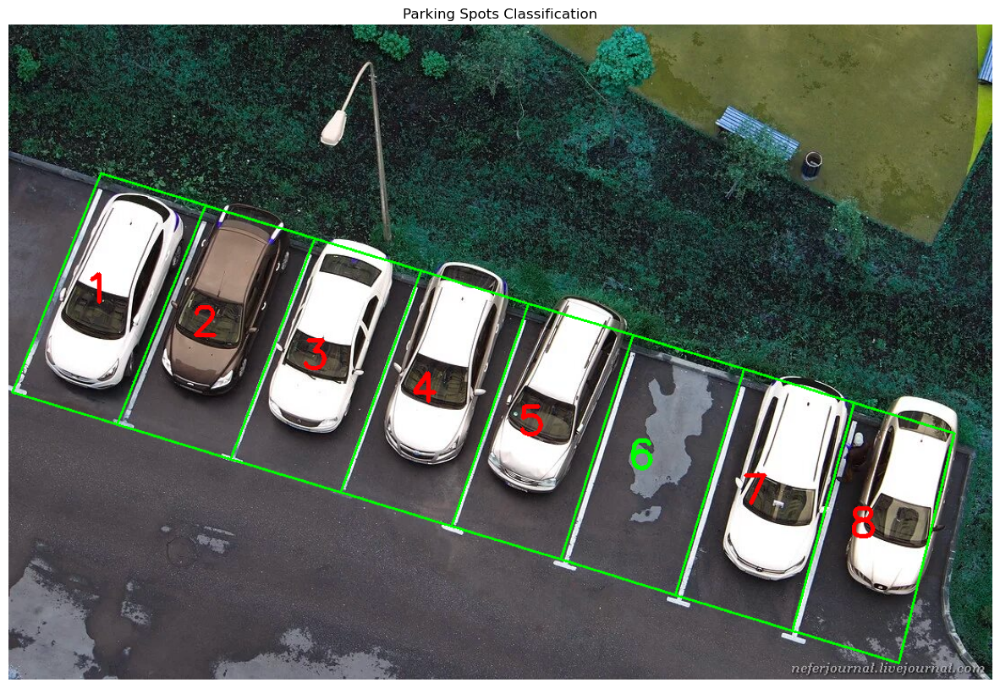

In [14]:
# hard/21.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/hard/21.png', show_result=show_result)
image_bin = psdc_binarize(image_blurred, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, 
                                                             show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, 
                                                      longest_base_line, show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, 
                                                     show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              show_result=show_result)
psdc_classify_parking_spot_by_entropy(image, image_gray, parking_spots, entropy_threshold=4.42)

Vacant Slot = 28 / 34


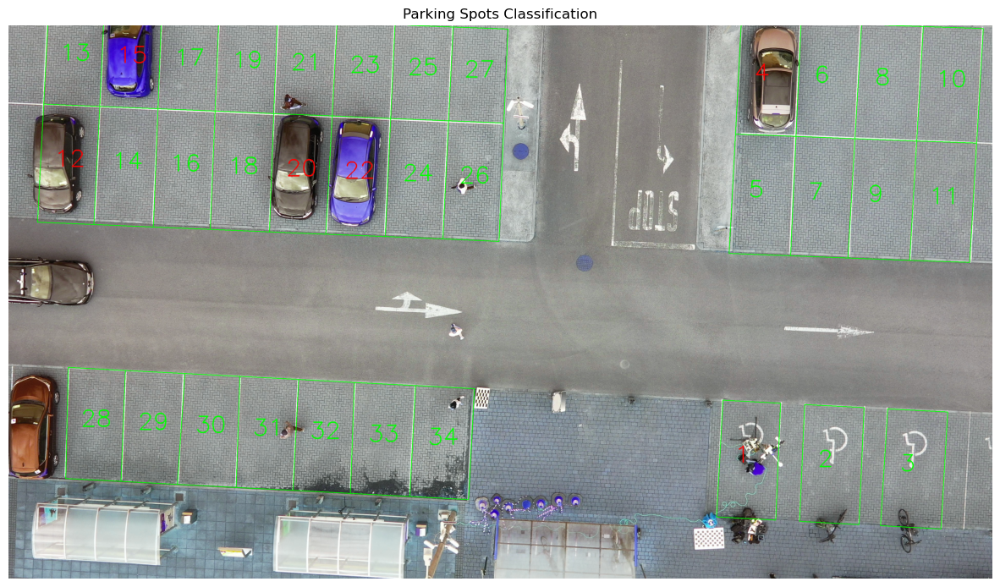

In [15]:
# hard/frame600.jpg
show_result = False
image, image_gray, image_blurred = psdc_blur('images/hard/frame600.jpg', show_result=show_result)
image_bin = psdc_binarize(image_blurred, 196, grad_ksize=0, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(30, 250, 40), show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(120, 350, 170),
                                                      hough_line_v_params=(150, 180, 30),  
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, 
                                                     merge_v_threshold=10,
                                                     show_result=show_result)                                                                                          
keypoints = psdc_detect_feature(image, image_gray, show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.5, hw_ratio_min = 1.5,
                                              area_max = 120000, area_min = 75000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints, 
                                      keypoint_count_threshold=10, keypoint_size_threshold=10,
                                      text_scale=1.0)

Vacant Slot = 141 / 167


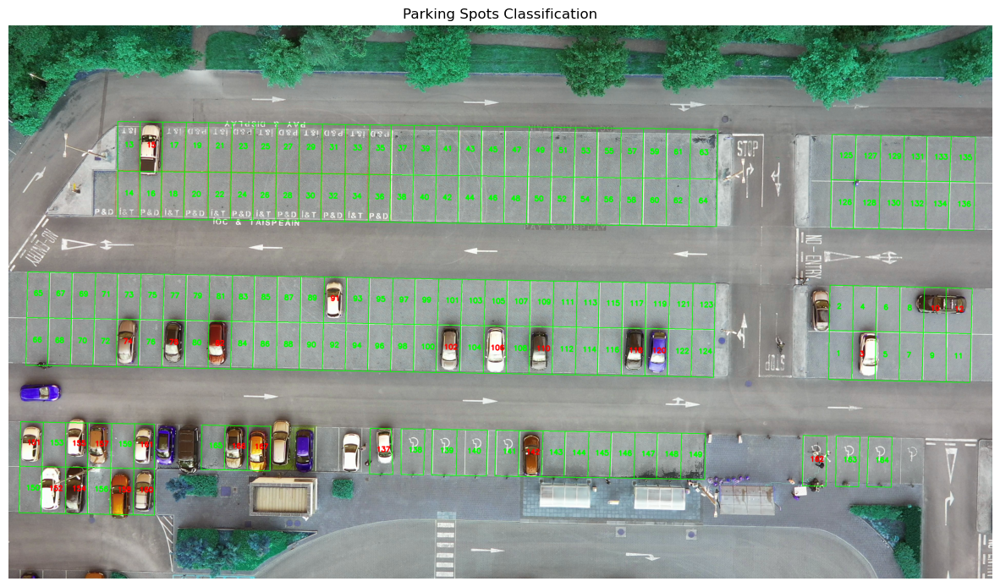

In [16]:
# hard/frame1.jpg
show_result = False
image, image_gray, image_blurred = psdc_blur('images/hard/frame1.jpg',
                                             improve_contrast=False, detail_enhance=0, 
                                             show_result=show_result)
image_bin = psdc_binarize(image_blurred, 32, grad_ksize=3, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, canny_threshold=(18, 180), show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(50, 300, 20), color_threshold=120,
                                          show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, 
                                                         kernel_size_h=8, kernel_size_v=8,
                                                         show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, 
                                                             show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(200, 450, 90),
                                                      hough_line_v_params=(20, 95, 27),  
                                                      color_threshold=120,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h,
                                                     angle_tolerance=1, show_result=show_result)                                                                                          
keypoints = psdc_detect_feature(image, image_gray, contrast_threshold=0.11, show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=110, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.5, hw_ratio_min = 1.5,
                                              area_max = 24000, area_min = 13000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints, 
                                      keypoint_count_threshold=3, keypoint_size_threshold=7,
                                      text_scale=0.3)

Vacant Slot = 26 / 38


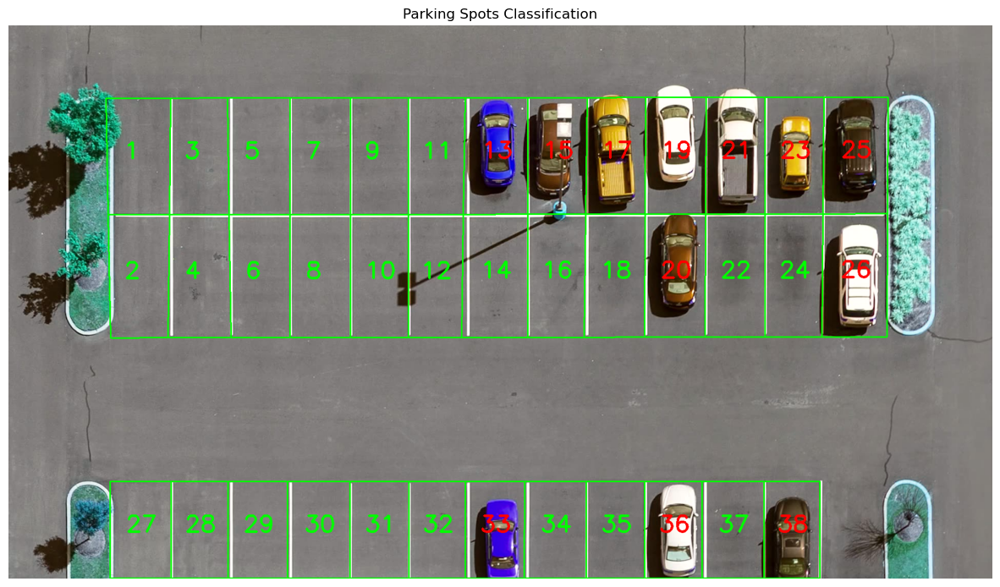

In [17]:
# medium/12.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/medium/12.png',
                                             show_result=show_result)
image_bin = psdc_binarize(image_blurred, 90, grad_ksize=3, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(25, 300, 80), color_threshold=120,
                                          show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, 
                                                         show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, 
                                                             show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(120, 350, 170),
                                                      hough_line_v_params=(30, 60, 28),  
                                                      color_threshold=120, angle_tolerance=2,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h,
                                                     merge_v_threshold=40, angle_tolerance=1, 
                                                     show_result=show_result)                                                                                          
keypoints = psdc_detect_feature(image, image_gray, contrast_threshold=0.02, show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=130, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.5, hw_ratio_min = 1.5,
                                              area_max = 45000, area_min = 18000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints, 
                                      keypoint_count_threshold=35, keypoint_size_threshold=3,
                                      text_scale=0.5)

Vacant Slot = 19 / 34


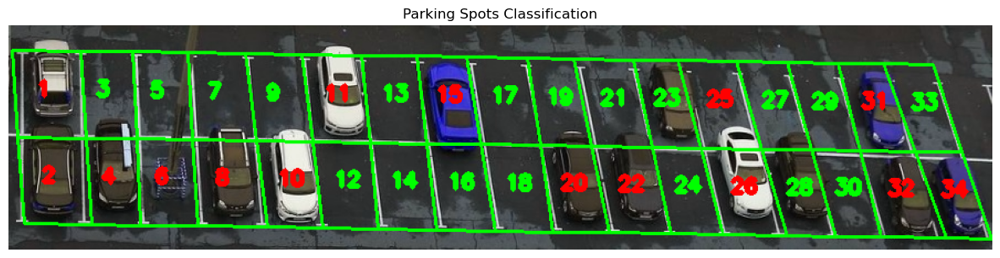

In [18]:
# medium/30.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/medium/30.png',
                                             show_result=show_result)
image_bin = psdc_binarize(image_blurred, 145, grad_ksize=0, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(25, 30, 40), color_threshold=0,
                                          show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, image_canny, image_canny, longest_base_line,
                                                      hough_line_h_params=(25, 300, 40),
                                                      hough_line_v_params=(22, 15, 6),  
                                                      color_threshold=0, angle_tolerance=30,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h,
                                                     merge_v_threshold=12, angle_tolerance=10, 
                                                     show_result=show_result)                                                                                          
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=130, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=3.5, hw_ratio_min = 1.2,
                                              area_max = 25000, area_min = 2000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_entropy(image, image_gray, parking_spots, text_scale=0.2, entropy_threshold=4.42)

Vacant Slot = 10 / 21


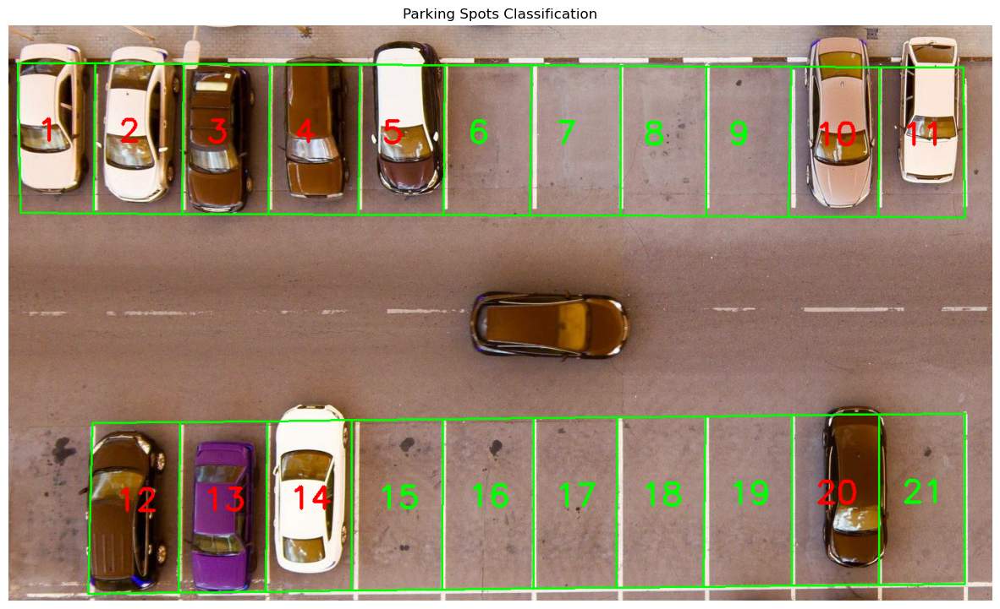

In [19]:
# medium/31.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/medium/31.png', detail_enhance=0, improve_contrast=False,
                                              show_result=show_result)
image_bin = psdc_binarize(image_blurred, 70, grad_ksize=3, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(25, 300, 80), color_threshold=0,
                                          show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(120, 500, 200),
                                                      hough_line_v_params=(30, 30, 28),  
                                                      color_threshold=120, angle_tolerance=2,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, 
                                                     merge_v_threshold=50, angle_tolerance=1,
                                                     show_result=show_result)                                                                                          
keypoints = psdc_detect_feature(image, image_gray, contrast_threshold=0.02, show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=130, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.5, hw_ratio_min = 1.5,
                                              area_max = 45000, area_min = 20000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints, 
                                      keypoint_count_threshold=16, keypoint_size_threshold=6,
                                      text_scale=0.5)

Vacant Slot = 8 / 26


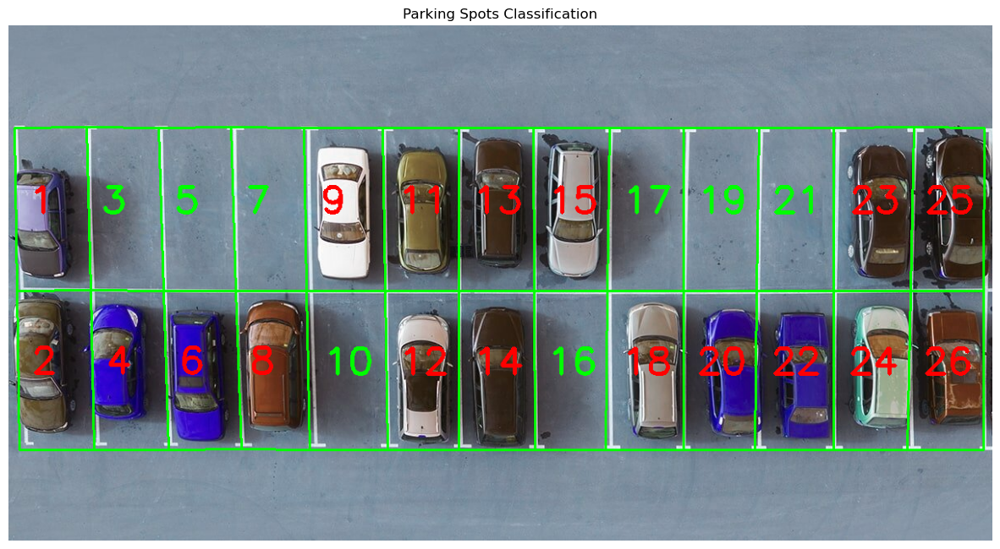

In [20]:
# easy/20.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/easy/20.png', detail_enhance=0, improve_contrast=False,
                                              show_result=show_result)
image_bin = psdc_binarize(image_blurred, 70, grad_ksize=3, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(25, 300, 20), color_threshold=0,
                                          show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(120, 500, 70),
                                                      hough_line_v_params=(30, 60, 28),  
                                                      color_threshold=120, angle_tolerance=2,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, 
                                                     merge_v_threshold=50, angle_tolerance=1,
                                                     show_result=show_result)                                                                                          
keypoints = psdc_detect_feature(image, image_gray, contrast_threshold=0.02, show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=130, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.5, hw_ratio_min = 1.0,
                                              area_max = 30000, area_min = 16000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints, 
                                      keypoint_count_threshold=11, keypoint_size_threshold=6,
                                      text_scale=0.5)

Vacant Slot = 7 / 24


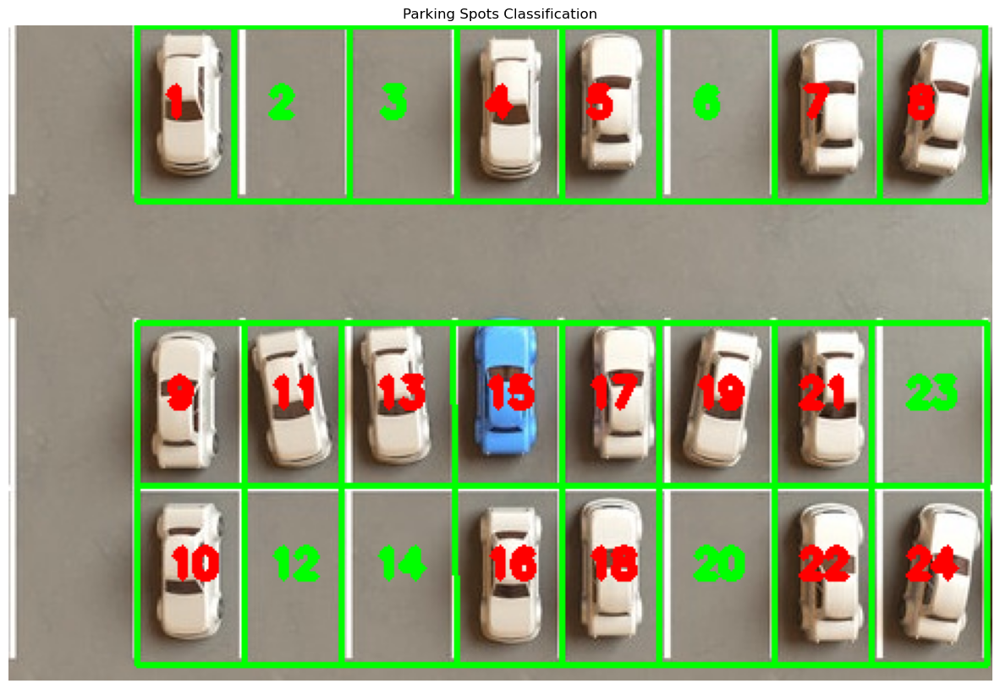

In [21]:
# easy/29.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/easy/29.png', detail_enhance=0, improve_contrast=False,
                                              show_result=show_result)
image_bin = psdc_binarize(image_blurred, 70, grad_ksize=3, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(25, 300, 20), color_threshold=0,
                                          show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(120, 400, 10),
                                                      hough_line_v_params=(10, 30, 16),  
                                                      color_threshold=120, angle_tolerance=2,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, 
                                                     merge_v_threshold=10, angle_tolerance=1,
                                                     show_result=show_result)                                                                                          
keypoints = psdc_detect_feature(image, image_gray, contrast_threshold=0.02, show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=59, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.5, hw_ratio_min = 1.3,
                                              area_max = 50000, area_min = 3000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints, 
                                      keypoint_count_threshold=5, keypoint_size_threshold=6,
                                      text_scale=0.2)

Vacant Slot = 14 / 14


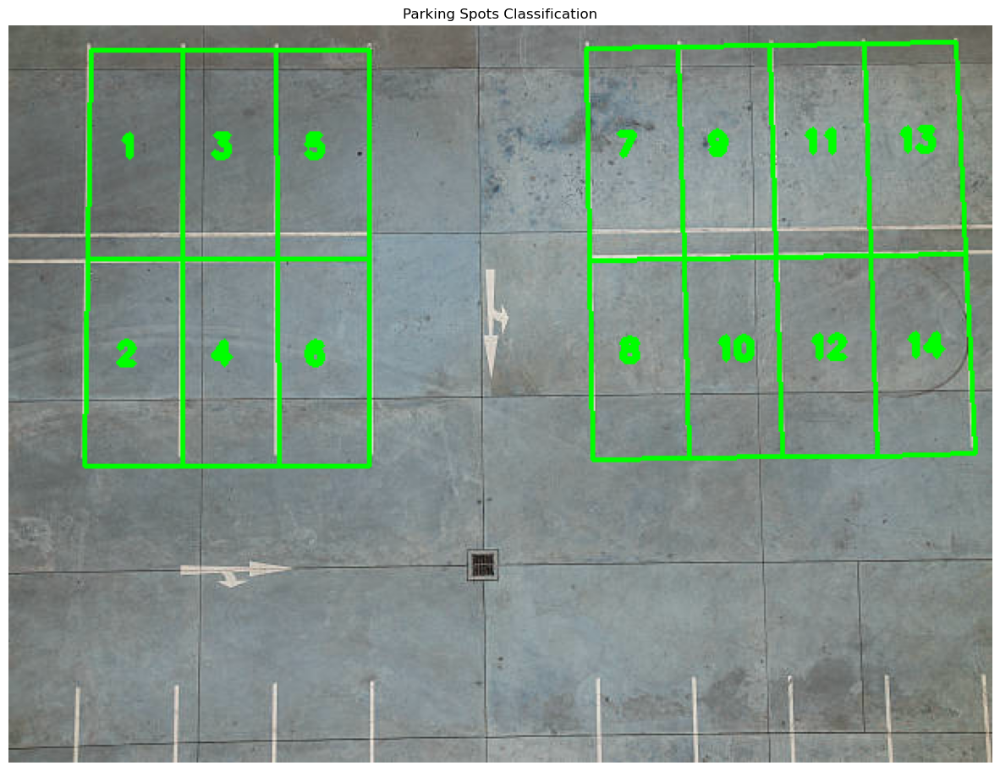

In [22]:
# easy/easy.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/easy/easy.jpg', detail_enhance=3, 
                                            gaussian_blur_ksize=5, gaussian_blur_sigma=0, unsharp_mask_ksize=5,
                                            show_result=show_result)
image_bin = psdc_binarize(image_blurred, 200, grad_ksize=0, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(25, 300, 50), color_threshold=0,
                                          show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(30, 120, 22),
                                                      hough_line_v_params=(10, 100, 22),  
                                                      color_threshold=120, angle_tolerance=2,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, 
                                                     merge_h_threshold=10, merge_v_threshold=10, angle_tolerance=1,
                                                     show_result=show_result)                                                                                          
keypoints = psdc_detect_feature(image, image_gray, contrast_threshold=0.02, show_result=show_result)
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=75, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.4, hw_ratio_min = 1.8,
                                              area_max = 8000, area_min = 3000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_feature(image, parking_spots, keypoints, 
                                      keypoint_count_threshold=50, keypoint_size_threshold=6,
                                      text_scale=0.2)

Vacant Slot = 10 / 14


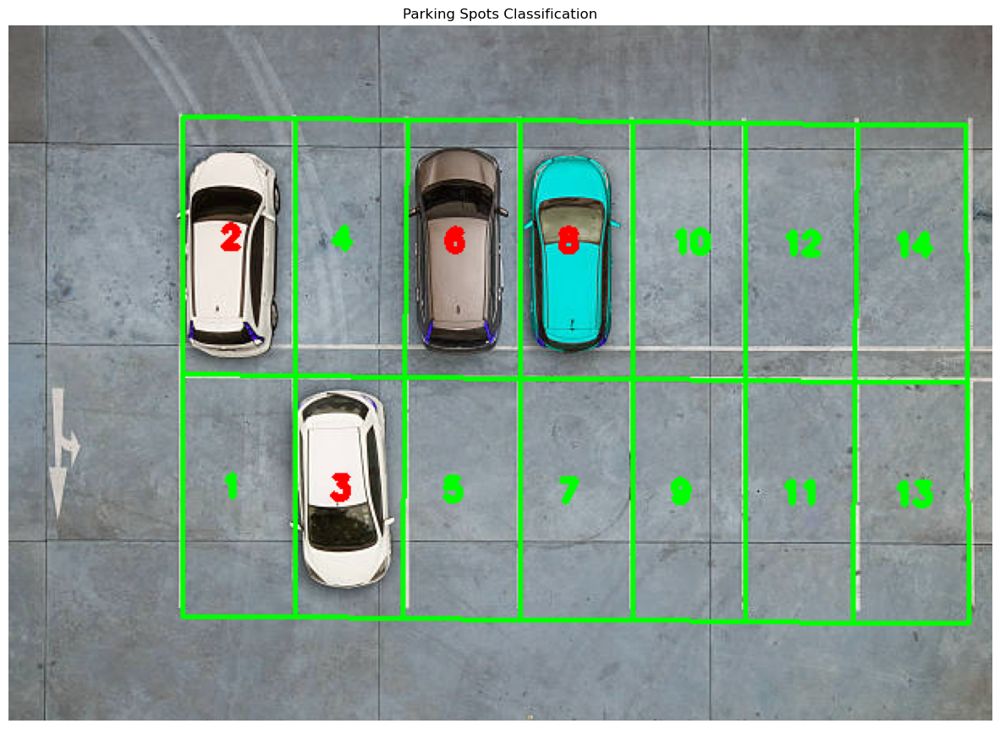

In [23]:
# easy/not_that_easy.png
show_result = False
image, image_gray, image_blurred = psdc_blur('images/easy/not_that_easy.jpg', detail_enhance=3, 
                                            gaussian_blur_ksize=5, gaussian_blur_sigma=0, unsharp_mask_ksize=5,
                                            show_result=show_result)
image_bin = psdc_binarize(image_blurred, 200, grad_ksize=0, show_result=show_result)
image_canny = psdc_pre_process_detect_edge(image_bin, show_result=show_result)
longest_base_line = psdc_detect_base_line(image, image_gray, image_canny, 
                                          hough_line_params=(100, 350, 40), color_threshold=0,
                                          show_result=show_result)
image_dilated_h, image_dilated_v = psdc_erode_and_dilate(image_bin, longest_base_line, show_result=show_result)
canny_image_h, canny_image_v = psdc_post_process_detect_edge(image_dilated_h, image_dilated_v, show_result=show_result)
white_segments_h, white_segments_v = psdc_detect_line(image, image_gray, canny_image_h, canny_image_v, longest_base_line,
                                                      hough_line_h_params=(100, 200, 60),
                                                      hough_line_v_params=(10, 100, 22),  
                                                      color_threshold=120, angle_tolerance=2,
                                                      show_result=show_result)
white_segments_h, white_segments_v = psdc_merge_line(image, longest_base_line, white_segments_v, white_segments_h, 
                                                     merge_h_threshold=10, merge_v_threshold=10, angle_tolerance=1,
                                                     show_result=show_result)                                                                                          
line_segment_groups_v = psdc_cluster_line(white_segments_v, threshold=75, show_result=show_result)
parking_spots = psdc_reconstruct_parking_spot(image, white_segments_h, line_segment_groups_v, 
                                              hw_ratio_max=2.4, hw_ratio_min = 1.5,
                                              area_max = 15000, area_min = 10000,
                                              show_result=show_result)
psdc_classify_parking_spot_by_entropy(image, image_gray, parking_spots, text_scale=0.2, entropy_threshold=4.42)